<a href="https://colab.research.google.com/github/bfbarry/nma-group1-project/blob/Urvi/Copy_of_Yunchang_ECoG_motor_imagery_LR.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Loading of Miller ECoG data of motor imagery

includes some visualizations

In [3]:
#@title Data retrieval
import os, requests

fname = 'motor_imagery.npz'
url = "https://osf.io/ksqv8/download"

if not os.path.isfile(fname):
  try:
    r = requests.get(url)
  except requests.ConnectionError:
    print("!!! Failed to download data !!!")
  else:
    if r.status_code != requests.codes.ok:
      print("!!! Failed to download data !!!")
    else:
      with open(fname, "wb") as fid:
        fid.write(r.content)


In [12]:
#@title Install packages, import matplotlib and set defaults
# install packages to visualize brains and electrode locations
!pip install nilearn --quiet
!pip install nimare --quiet

from matplotlib import rcParams 
from matplotlib import pyplot as plt
rcParams['figure.figsize'] = [20, 4]
rcParams['font.size'] =15
rcParams['axes.spines.top'] = False
rcParams['axes.spines.right'] = False
rcParams['figure.autolayout'] = True

!pip install neurodsp
!pip install mne
# General imports
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import cm, colors

# Import MNE, as well as the MNE sample dataset
import mne
from mne import io
from mne.datasets import sample
from mne.viz import plot_topomap

# Import some NeuroDSP functions to use with MNE
from neurodsp.spectral import compute_spectrum, trim_spectrum
from neurodsp.burst import detect_bursts_dual_threshold
from neurodsp.rhythm import compute_lagged_coherence

# Import NeuroDSP plotting functions
from neurodsp.plts import (plot_time_series, plot_power_spectra,
                           plot_bursts, plot_lagged_coherence)
#Sklearn SVM SVC with CV
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn import svm
from sklearn.svm import SVC
from sklearn import datasets
from sklearn.model_selection import cross_val_score
from sklearn.datasets import load_iris
from sklearn.linear_model import LogisticRegressionCV


# Transforming data into frequency domain (adapted from Brian)

https://neurodsp-tools.github.io/neurodsp/_modules/neurodsp/spectral/power.html



In [4]:
#@title Run: Helper functions

def extract_epochs(subj, exp, muscle,epoch_win):
    # for each label (muscle type), extract voltage in the time window with epoch_length

    # input:
      # subject: 0-6
      # exp: 0 - overt, 1 - imagery
      # muscle: "hand", "tongue"
      # epoch_win: time window to extract data from each epoch of interest (planning period for the movement (either over/imagery))

    # return: voltage traces in time window epoch_length of a specific subject, experiment (overt/imagery), muscle (hand/tongue)
    
    # calculate epoch duration
    epoch_length = epoch_win[1]-epoch_win[0]

    # pick subject number and experiment type (overt/imagery)
    dat = alldat[subj][exp]

    # V is the voltage data
    V = dat['V'].astype('float32')

    nt, nchan = V.shape
    nstim = len(dat['t_on'])
    stim_id = {'tongue':11, 'hand':12}[muscle]
    trange = np.arange(epoch_win[0], epoch_win[1]) #time range
    ts = dat['t_on'][:,np.newaxis] + trange #time series 
    V_epochs = np.reshape(V[ts, :], (nstim, epoch_length, nchan))
    return V_epochs[dat['stim_id']==stim_id] 

def comp_avg_signal(V, length, muscle):
    """average the broadband power across all tongue and hand trials"""
    nt, nchan = V.shape
    nstim = len(dat['t_on'])
    stim_id = {'tongue':11, 'hand':12}[muscle]
    trange = np.arange(0, length) #time range?
    ts = dat['t_on'][:,np.newaxis] + trange #time series 
    V_epochs = np.reshape(V[ts, :], (nstim, length, nchan))
    return (V_epochs[dat['stim_id']==stim_id]).mean(0) # averging across the experiment no.

def pre_process(subj, exp, hpf=None):
    """quick way to get broadband power in time-varying windows"""
    # pick subject number and experiment type (overt/imagery)
    dat = alldat[subj][exp]

    # V is the voltage data
    V = dat['V'].astype('float32')
    
    if hpf:
        # high-pass filter above 50 Hz
        b, a = signal.butter(3, [hpf], btype = 'high', fs=1000) # why is it a thrid order filter?
        V = signal.filtfilt(b,a,V,0)

        # compute smooth envelope of this signal = approx power
        V = np.abs(V)**2
        b, a = signal.butter(3, [10], btype = 'low', fs=1000)
        V = signal.filtfilt(b,a,V,0)

        # normalize each channel so its mean power is 1
        V = V/V.mean(0) 
    return V

# LR on all finer time window 

In [8]:
#@title load data

alldat = np.load(fname, allow_pickle=True)['dat']


In [9]:
muscle = "hand"
epoch_win=[]
time_windows=[[0,500], [500,1000], [1000,1500],[1500,2000],[2000,2500],[2500,3000], [0,1000],[0,1500],[0,2000] ,[0,3000],[500,1500],[1500,3000]]
scores_ave_vec=np.zeros(7)
for t in range(12):
  epoch_win=time_windows[t]
  print(epoch_win)
  for subj in range(7):
    # Settings
    # subj = 3

    # Extract epochs (trials x length x channels)
    V_overt_mat = extract_epochs(subj, 0, muscle, epoch_win)
    V_ima_mat = extract_epochs(subj, 1, muscle, epoch_win)

    nTrials,nBins,nChannels = np.shape(V_overt_mat)

    # Convert voltage traces into frequency domain by psd
    kwargs = {'fs':3000, 'nperseg':None, 'noverlap':None}
    freq_of_interest = (1,101) # Get freq psd from 1-100 Hz
    nFreq = freq_of_interest[1]-freq_of_interest[0]
    psds_overt_mat = np.zeros((nTrials,nChannels,nFreq))
    psds_ima_mat = np.zeros((nTrials,nChannels,nFreq))

    for trial in range(nTrials):
      for chan in range(nChannels):
        # overt
        freqs, powers = compute_spectrum(V_overt_mat[trial,:,chan], **kwargs)
        psds_overt_mat[trial,chan,:]=powers[freq_of_interest[0]:freq_of_interest[1]]
        # imagery
        freqs, powers = compute_spectrum(V_ima_mat[trial,:,chan], **kwargs)
        psds_ima_mat[trial,chan,:]=powers[freq_of_interest[0]:freq_of_interest[1]]

    np.shape(psds_overt_mat)



    nCV = 5
    # Preparing data
    psds_overt_mat_reshaped = np.reshape(psds_overt_mat,(nTrials,nChannels*nFreq))
    psds_ima_mat_reshaped = np.reshape(psds_ima_mat,(nTrials,nChannels*nFreq))
    X = np.concatenate((psds_overt_mat_reshaped, psds_ima_mat_reshaped))
    y = np.concatenate((np.zeros(len(psds_overt_mat)),np.ones(len(psds_ima_mat))))


    # CV SVM fit and test
    clf = LogisticRegressionCV(cv=5, random_state=0).fit(X, y)
    scores = cross_val_score(clf, X, y, cv=nCV)
    #print("Score per cv:")
    #print(scores)
    scores_ave = np.mean(scores)
    # print("Score peon average:")
    # print(scores_ave)
    scores_ave_vec[subj]=scores_ave
  print(scores_ave_vec)

[0, 500]
[500, 1000]
[1000, 1500]
[0, 1000]
[0, 1500]
[500, 1500]
[1500, 3000]


In [ ]:
muscle = "hand"
epoch_win=[]
time_windows=[[0,500], [500,1000], [1000,1500],[1500,2000],[2000,2500],[2500,3000], [0,1000],[0,1500],[0,2000] ,[0,3000],[500,1500],[1500,3000]]
scores_ave_vec=np.zeros(7)
for t in range(12):
  epoch_win=time_windows[t]
  print(epoch_win)
  for subj in range(7):
    # Settings
    # subj = 3

    # Extract epochs (trials x length x channels)
    V_overt_mat = extract_epochs(subj, 0, muscle, epoch_win)
    V_ima_mat = extract_epochs(subj, 1, muscle, epoch_win)

    nTrials,nBins,nChannels = np.shape(V_overt_mat)

    # Convert voltage traces into frequency domain by psd
    kwargs = {'fs':1000, 'nperseg':None, 'noverlap':None}
    freq_of_interest = (1,101) # Get freq psd from 1-100 Hz
    nFreq = freq_of_interest[1]-freq_of_interest[0]
    psds_overt_mat = np.zeros((nTrials,nChannels,nFreq))
    psds_ima_mat = np.zeros((nTrials,nChannels,nFreq))

    for trial in range(nTrials):
      for chan in range(nChannels):
        # overt
        freqs, powers = compute_spectrum(V_overt_mat[trial,:,chan], **kwargs)
        psds_overt_mat[trial,chan,:]=powers[freq_of_interest[0]:freq_of_interest[1]]
        # imagery
        freqs, powers = compute_spectrum(V_ima_mat[trial,:,chan], **kwargs)
        psds_ima_mat[trial,chan,:]=powers[freq_of_interest[0]:freq_of_interest[1]]

    np.shape(psds_overt_mat)



    nCV = 5
    # Preparing data
    psds_overt_mat_reshaped = np.reshape(psds_overt_mat,(nTrials,nChannels*nFreq))
    psds_ima_mat_reshaped = np.reshape(psds_ima_mat,(nTrials,nChannels*nFreq))
    X = np.concatenate((psds_overt_mat_reshaped, psds_ima_mat_reshaped))
    y = np.concatenate((np.zeros(len(psds_overt_mat)),np.ones(len(psds_ima_mat))))


    # CV SVM fit and test
    clf = LogisticRegressionCV(cv=5, random_state=0).fit(X, y)
    scores = cross_val_score(clf, X, y, cv=nCV)
    #print("Score per cv:")
    #print(scores)
    scores_ave = np.mean(scores)
    # print("Score peon average:")
    # print(scores_ave)
    scores_ave_vec[subj]=scores_ave
  print(scores_ave_vec)

# # Example confusion matrix
# X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=nCV)
# clf = make_pipeline(StandardScaler(), SVC(gamma='auto'))
# clf.fit(X, y)
# Pipeline(steps=[('standardscaler', StandardScaler()),('svc', SVC(gamma='auto'))])

[0, 500]


/usr/local/lib/python3.7/dist-packages/scipy/signal/spectral.py:1966: UserWarning: nperseg = 1000 is greater than input length  = 500, using nperseg = 500
  .format(nperseg, input_length))
/usr/local/lib/python3.7/dist-packages/scipy/signal/spectral.py:1966: UserWarning: nperseg = 1000 is greater than input length  = 500, using nperseg = 500
  .format(nperseg, input_length))
/usr/local/lib/python3.7/dist-packages/scipy/signal/spectral.py:1966: UserWarning: nperseg = 1000 is greater than input length  = 500, using nperseg = 500
  .format(nperseg, input_length))
/usr/local/lib/python3.7/dist-packages/scipy/signal/spectral.py:1966: UserWarning: nperseg = 1000 is greater than input length  = 500, using nperseg = 500
  .format(nperseg, input_length))
/usr/local/lib/python3.7/dist-packages/scipy/signal/spectral.py:1966: UserWarning: nperseg = 1000 is greater than input length  = 500, using nperseg = 500
  .format(nperseg, input_length))
/usr/local/lib/python3.7/dist-packages/scipy/signal/spe

[0.75       0.6        0.56666667 0.53333333 0.56666667 0.51666667
 0.8       ]
[500, 1000]


/usr/local/lib/python3.7/dist-packages/scipy/signal/spectral.py:1966: UserWarning: nperseg = 1000 is greater than input length  = 500, using nperseg = 500
  .format(nperseg, input_length))
/usr/local/lib/python3.7/dist-packages/scipy/signal/spectral.py:1966: UserWarning: nperseg = 1000 is greater than input length  = 500, using nperseg = 500
  .format(nperseg, input_length))
/usr/local/lib/python3.7/dist-packages/scipy/signal/spectral.py:1966: UserWarning: nperseg = 1000 is greater than input length  = 500, using nperseg = 500
  .format(nperseg, input_length))
/usr/local/lib/python3.7/dist-packages/scipy/signal/spectral.py:1966: UserWarning: nperseg = 1000 is greater than input length  = 500, using nperseg = 500
  .format(nperseg, input_length))
/usr/local/lib/python3.7/dist-packages/scipy/signal/spectral.py:1966: UserWarning: nperseg = 1000 is greater than input length  = 500, using nperseg = 500
  .format(nperseg, input_length))
/usr/local/lib/python3.7/dist-packages/scipy/signal/spe

[0.88333333 0.43333333 0.61666667 0.56666667 0.56666667 0.56666667
 0.76666667]
[1000, 1500]


/usr/local/lib/python3.7/dist-packages/scipy/signal/spectral.py:1966: UserWarning: nperseg = 1000 is greater than input length  = 500, using nperseg = 500
  .format(nperseg, input_length))
/usr/local/lib/python3.7/dist-packages/scipy/signal/spectral.py:1966: UserWarning: nperseg = 1000 is greater than input length  = 500, using nperseg = 500
  .format(nperseg, input_length))
/usr/local/lib/python3.7/dist-packages/scipy/signal/spectral.py:1966: UserWarning: nperseg = 1000 is greater than input length  = 500, using nperseg = 500
  .format(nperseg, input_length))
/usr/local/lib/python3.7/dist-packages/scipy/signal/spectral.py:1966: UserWarning: nperseg = 1000 is greater than input length  = 500, using nperseg = 500
  .format(nperseg, input_length))
/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_logistic.py:940: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data 

[0.81666667 0.53333333 0.66666667 0.46666667 0.38333333 0.53333333
 0.83333333]
[1500, 2000]


/usr/local/lib/python3.7/dist-packages/scipy/signal/spectral.py:1966: UserWarning: nperseg = 1000 is greater than input length  = 500, using nperseg = 500
  .format(nperseg, input_length))
/usr/local/lib/python3.7/dist-packages/scipy/signal/spectral.py:1966: UserWarning: nperseg = 1000 is greater than input length  = 500, using nperseg = 500
  .format(nperseg, input_length))
/usr/local/lib/python3.7/dist-packages/scipy/signal/spectral.py:1966: UserWarning: nperseg = 1000 is greater than input length  = 500, using nperseg = 500
  .format(nperseg, input_length))
/usr/local/lib/python3.7/dist-packages/scipy/signal/spectral.py:1966: UserWarning: nperseg = 1000 is greater than input length  = 500, using nperseg = 500
  .format(nperseg, input_length))
/usr/local/lib/python3.7/dist-packages/scipy/signal/spectral.py:1966: UserWarning: nperseg = 1000 is greater than input length  = 500, using nperseg = 500
  .format(nperseg, input_length))
/usr/local/lib/python3.7/dist-packages/scipy/signal/spe

[0.68333333 0.58333333 0.51666667 0.58333333 0.65       0.5
 0.81666667]
[2000, 2500]


/usr/local/lib/python3.7/dist-packages/scipy/signal/spectral.py:1966: UserWarning: nperseg = 1000 is greater than input length  = 500, using nperseg = 500
  .format(nperseg, input_length))
/usr/local/lib/python3.7/dist-packages/scipy/signal/spectral.py:1966: UserWarning: nperseg = 1000 is greater than input length  = 500, using nperseg = 500
  .format(nperseg, input_length))
/usr/local/lib/python3.7/dist-packages/scipy/signal/spectral.py:1966: UserWarning: nperseg = 1000 is greater than input length  = 500, using nperseg = 500
  .format(nperseg, input_length))
/usr/local/lib/python3.7/dist-packages/scipy/signal/spectral.py:1966: UserWarning: nperseg = 1000 is greater than input length  = 500, using nperseg = 500
  .format(nperseg, input_length))
/usr/local/lib/python3.7/dist-packages/scipy/signal/spectral.py:1966: UserWarning: nperseg = 1000 is greater than input length  = 500, using nperseg = 500
  .format(nperseg, input_length))
/usr/local/lib/python3.7/dist-packages/scipy/signal/spe

[0.46666667 0.65       0.45       0.56666667 0.6        0.61666667
 0.83333333]
[2500, 3000]


/usr/local/lib/python3.7/dist-packages/scipy/signal/spectral.py:1966: UserWarning: nperseg = 1000 is greater than input length  = 500, using nperseg = 500
  .format(nperseg, input_length))
/usr/local/lib/python3.7/dist-packages/scipy/signal/spectral.py:1966: UserWarning: nperseg = 1000 is greater than input length  = 500, using nperseg = 500
  .format(nperseg, input_length))
/usr/local/lib/python3.7/dist-packages/scipy/signal/spectral.py:1966: UserWarning: nperseg = 1000 is greater than input length  = 500, using nperseg = 500
  .format(nperseg, input_length))
/usr/local/lib/python3.7/dist-packages/scipy/signal/spectral.py:1966: UserWarning: nperseg = 1000 is greater than input length  = 500, using nperseg = 500
  .format(nperseg, input_length))
/usr/local/lib/python3.7/dist-packages/scipy/signal/spectral.py:1966: UserWarning: nperseg = 1000 is greater than input length  = 500, using nperseg = 500
  .format(nperseg, input_length))
/usr/local/lib/python3.7/dist-packages/scipy/signal/spe

[0.75       0.78333333 0.41666667 0.63333333 0.66666667 0.58333333
 0.86666667]
[0, 1000]
[0.81666667 0.76666667 0.71666667 0.66666667 0.68333333 0.65
 0.86666667]
[0, 1500]
[0.81666667 0.76666667 0.71666667 0.66666667 0.68333333 0.65
 0.86666667]
[0, 2000]
[0.88333333 0.73333333 0.65       0.55       0.58333333 0.61666667
 0.86666667]
[0, 3000]
[0.9        0.71666667 0.66666667 0.63333333 0.56666667 0.6
 0.9       ]
[500, 1500]
[0.81666667 0.6        0.55       0.65       0.45       0.61666667
 0.81666667]
[1500, 3000]


In [ ]:
# Example trial psd

# for trial in [10]:
#   plt.figure(figsize=(18,12))
#   for chan in range(nChannels):
#     plt.subplot(8,8,chan+1)
#     plt.semilogy(freqs[:100],psds_overt_mat[trial,chan,:], color = 'blue', label='overt')
#     plt.semilogy(freqs[:100],psds_ima_mat[trial,chan,:], color = 'red', label='ima')
#   plt.legend()
#   plt.show()


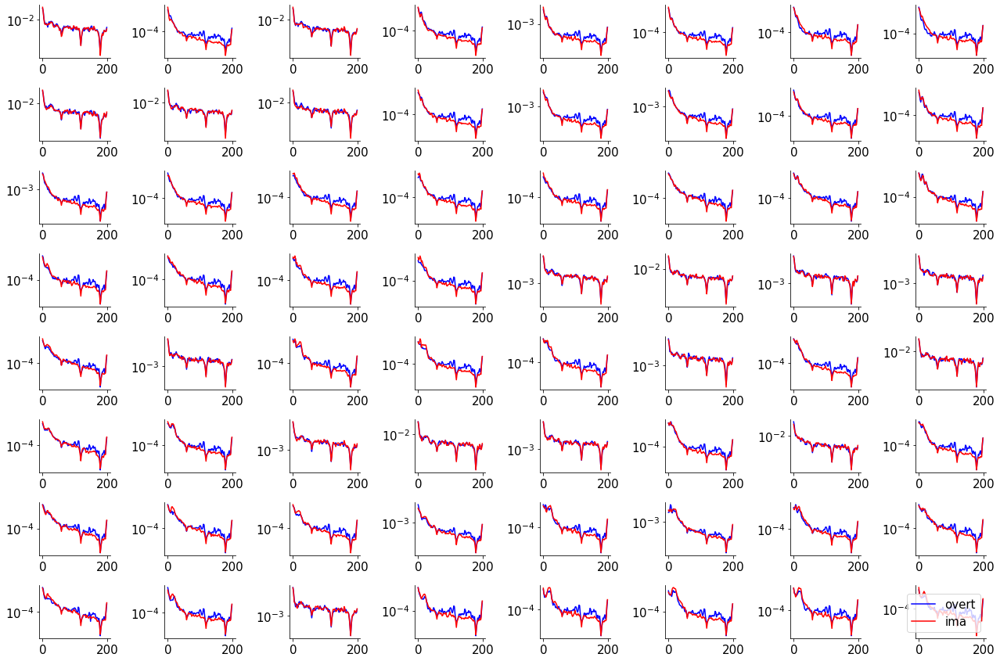

In [ ]:
# Average across trial psd
plt.figure(figsize=(18,12))
for chan in range(nChannels):
  plt.subplot(8,8,chan+1)
  plt.semilogy(freqs[:100],np.squeeze(psds_overt_mat[:,chan,:]).mean(0), color = 'blue', label='overt')
  plt.semilogy(freqs[:100],np.squeeze(psds_ima_mat[:,chan,:]).mean(0), color = 'red', label='ima')
plt.legend()  
plt.show()



In [ ]:
# Example trial psd

# for trial in [10]:
#   plt.figure(figsize=(18,12))
#   for chan in range(nChannels):
#     plt.subplot(8,8,chan+1)
#     plt.semilogy(freqs[:100],psds_overt_mat[trial,chan,:], color = 'blue', label='overt')
#     plt.semilogy(freqs[:100],psds_ima_mat[trial,chan,:], color = 'red', label='ima')
#   plt.legend()
#   plt.show()


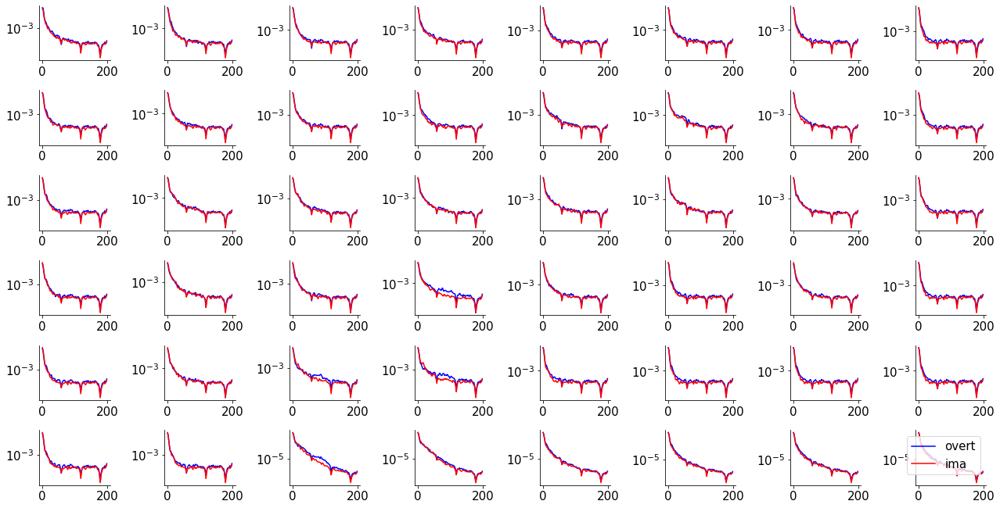

In [ ]:
# Average across trial psd
plt.figure(figsize=(18,12))
for chan in range(nChannels):
  plt.subplot(8,8,chan+1)
  plt.semilogy(freqs[:100],np.squeeze(psds_overt_mat[:,chan,:]).mean(0), color = 'blue', label='overt')
  plt.semilogy(freqs[:100],np.squeeze(psds_ima_mat[:,chan,:]).mean(0), color = 'red', label='ima')
plt.legend()  
plt.show()



# New Section

In [ ]:
# Settings
subj = 0
muscle = "hand"
epoch_win = [0,2000]


# Extract epochs (trials x length x channels)
V_overt_mat = extract_epochs(subj, 0, muscle, epoch_win)
V_ima_mat = extract_epochs(subj, 1, muscle, epoch_win)

nTrials,nBins,nChannels = np.shape(V_overt_mat)

In [ ]:
nTrials,nBins,nChannels

(30, 2000, 46)

In [ ]:
# Convert voltage traces into frequency domain by psd
kwargs = {'fs':1000, 'nperseg':None, 'noverlap':None}
freq_of_interest = (1,101) # Get freq psd from 1-100 Hz
nFreq = freq_of_interest[1]-freq_of_interest[0]
psds_overt_mat = np.zeros((nTrials,nChannels,nFreq))
psds_ima_mat = np.zeros((nTrials,nChannels,nFreq))

for trial in range(nTrials):
  for chan in range(nChannels):
    # overt
    freqs, powers = compute_spectrum(V_overt_mat[trial,:,chan], **kwargs)
    psds_overt_mat[trial,chan,:]=powers[freq_of_interest[0]:freq_of_interest[1]]
    # imagery
    freqs, powers = compute_spectrum(V_ima_mat[trial,:,chan], **kwargs)
    psds_ima_mat[trial,chan,:]=powers[freq_of_interest[0]:freq_of_interest[1]]

np.shape(psds_overt_mat)

(30, 46, 100)

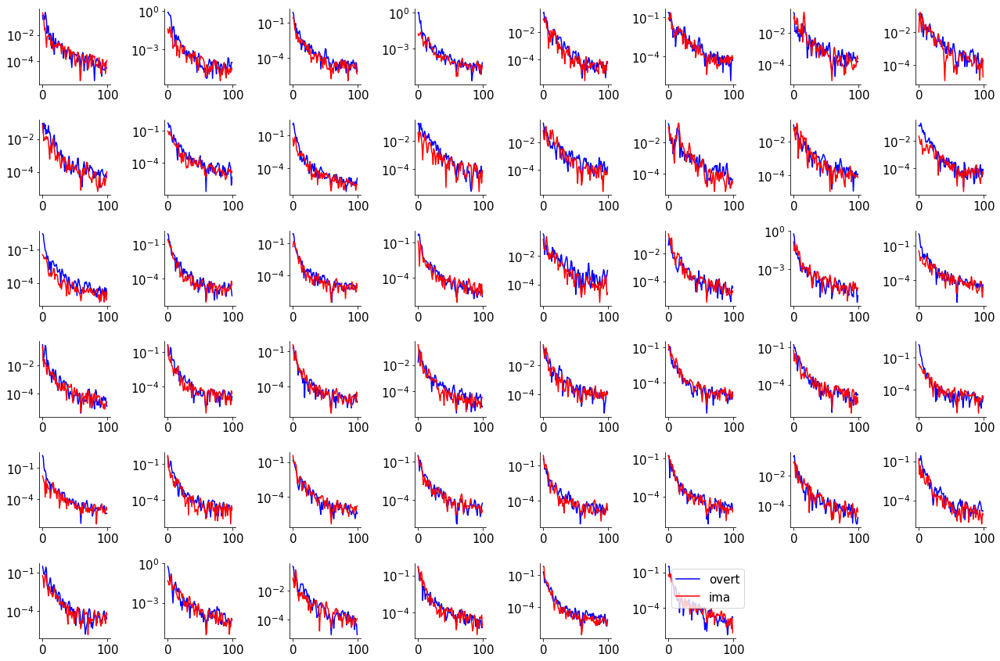

In [ ]:
# Example trial psd

for trial in [10]:
  plt.figure(figsize=(18,12))
  for chan in range(nChannels):
    plt.subplot(6,8,chan+1)
    plt.semilogy(freqs[:100],psds_overt_mat[trial,chan,:], color = 'blue', label='overt')
    plt.semilogy(freqs[:100],psds_ima_mat[trial,chan,:], color = 'red', label='ima')
  plt.legend()
  plt.show()
  



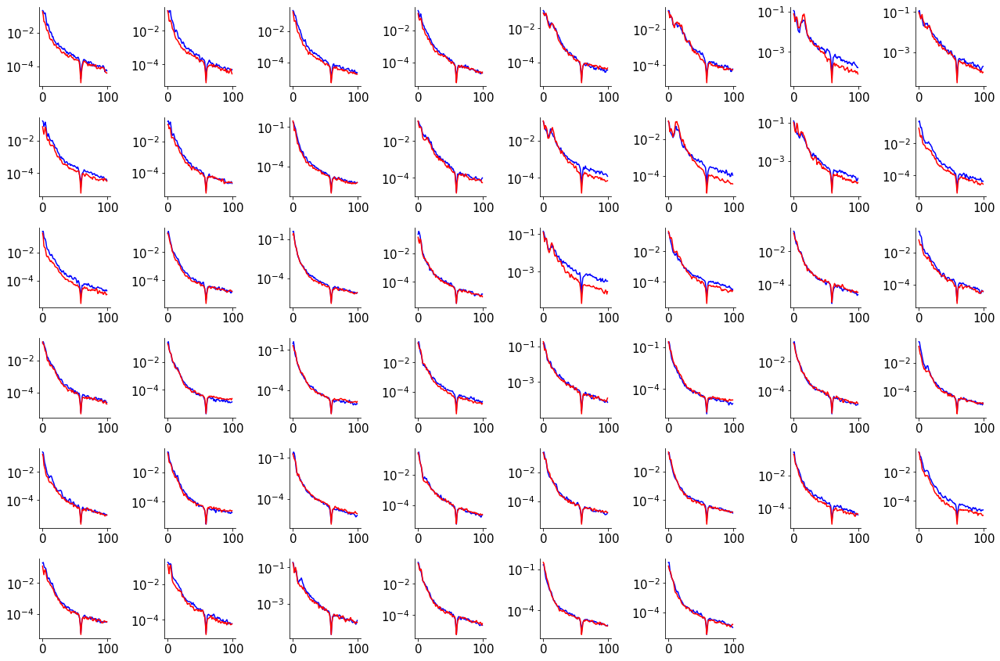

No handles with labels found to put in legend.


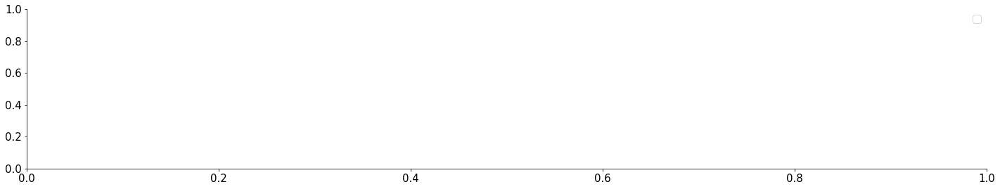

In [ ]:
# Average across trial psd
plt.figure(figsize=(18,12))
for chan in range(nChannels):
  plt.subplot(6,8,chan+1)
  plt.semilogy(freqs[:100],np.squeeze(psds_overt_mat[:,chan,:]).mean(0), color = 'blue', label='overt')
  plt.semilogy(freqs[:100],np.squeeze(psds_ima_mat[:,chan,:]).mean(0), color = 'red', label='ima')
plt.show()
plt.legend()


# for i in range(46):
#     plt.subplot(6,8,i+1)
#     plt.semilogy(freqs[:100],psds['overt'][i][:100], color = 'blue', label='overt')
#     plt.semilogy(freqs[:100],psds['imag'][i][:100], color = 'red', label = 'imag')
    
# 



# signals = {'overt': sample_overt, 'imag': sample_imag}
# psds = {'overt' : [], 'imag' : [] }
# for chan in range(46):
#     for k in psds.keys():
#         freqs, powers = compute_spectrum(signals[k][:,chan], **kwargs)
#         psds[k].append(powers)
# for k in psds.keys():
#     psds[k] = np.array(psds[k])

In [ ]:
#Sklearn SVM SVC with CV
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn import svm
from sklearn.svm import SVC
from sklearn import datasets
from sklearn.model_selection import cross_val_score

nCV = 5
# Preparing data
psds_overt_mat_reshaped = np.reshape(psds_overt_mat,(nTrials,nChannels*nFreq))
psds_ima_mat_reshaped = np.reshape(psds_ima_mat,(nTrials,nChannels*nFreq))
X = np.concatenate((psds_overt_mat_reshaped, psds_ima_mat_reshaped))
y = np.concatenate((np.zeros(len(psds_overt_mat)),np.ones(len(psds_ima_mat))))


# CV SVM fit and test
clf = svm.SVC(kernel='linear', C=1, random_state=42)
scores = cross_val_score(clf, X, y, cv=nCV)
print("Score per cv:")
print(scores)
scores_ave = np.mean(scores)
print("Score peon average:")
print(scores_ave)

# # Example confusion matrix
# X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=nCV)
# clf = make_pipeline(StandardScaler(), SVC(gamma='auto'))
# clf.fit(X, y)
# Pipeline(steps=[('standardscaler', StandardScaler()),('svc', SVC(gamma='auto'))])

Score per cv:
[0.75       0.91666667 1.         0.83333333 0.91666667]
Score peon average:
0.8833333333333334


In [ ]:
np.shape(psds_overt_mat[1,:,:])

(46, 100)

# Eyeballing data in different frequency band


In [ ]:
#@title Data loading
import numpy as np

alldat = np.load(fname, allow_pickle=True)['dat']

# select just one of the recordings here. 11 is nice because it has some neurons in vis ctx. 
dat1 = alldat[0][0]
dat2 = alldat[0][1]

print(dat1.keys())
print(dat2.keys())

dict_keys(['t_off', 'stim_id', 't_on', 'srate', 'V', 'scale_uv', 'locs', 'hemisphere', 'lobe', 'gyrus', 'Brodmann_Area'])
dict_keys(['t_off', 'stim_id', 't_on', 'srate', 'V', 'scale_uv', 'locs', 'hemisphere', 'lobe', 'gyrus', 'Brodmann_Area'])


# Dataset info #

This is one of multiple ECoG datasets from Miller 2019, recorded in a clinical settings with a variety of tasks. Raw data and dataset paper are here:

https://exhibits.stanford.edu/data/catalog/zk881ps0522
https://www.nature.com/articles/s41562-019-0678-3

This particular dataset was originally described in this paper: 

*Miller, Kai J., Gerwin Schalk, Eberhard E. Fetz, Marcel Den Nijs, Jeffrey G. Ojemann, and Rajesh PN Rao. "Cortical activity during motor execution, motor imagery, and imagery-based online feedback." Proceedings of the National Academy of Sciences (2010): 200913697.*

`dat1` and `dat2` are data from the two blocks performed in each subject. The first one was the actual movements, the second one was motor imagery. For the movement task, from the original dataset instructions:

*Patients performed simple, repetitive, motor tasks of hand (synchronous flexion and extension of all fingers, i.e., clenching and releasing a fist at a self-paced rate of ~1-2 Hz) or tongue (opening of mouth with protrusion and retraction of the tongue, i.e., sticking the tongue in and out, also at ~1-2 Hz). These movements were performed in an interval-based manner, alternating between movement and rest, and the side of move- ment was always contralateral to the side of cortical grid placement.*

For the imagery task, from the original dataset instructions:

*Following the overt movement experiment, each subject performed an imagery task, imagining making identical movement rather than executing the movement. The imagery was kinesthetic rather than visual (“imagine yourself performing the actions like you just did”; i.e., “don’t imagine what it looked like, but imagine making the motions”).*

Sample rate is always 1000Hz, and the ECoG data has been notch-filtered at 60, 120, 180, 240 and 250Hz, followed by z-scoring across time and conversion to float16 to minimize size. Please convert back to float32 after loading the data in the notebook, to avoid unexpected behavior. 

Both experiments: 
* `dat['V']`: continuous voltage data (time by channels)
* `dat['srate']`: acquisition rate (1000 Hz). All stimulus times are in units of this.  
* `dat['t_on']`: time of stimulus onset in data samples
* `dat['t_off']`: time of stimulus offset, always 400 samples after `t_on`
* `dat['stim_id`]: identity of stimulus (11 = tongue, 12 = hand), real or imaginary stimulus
* `dat['scale_uv']`: scale factor to multiply the data values to get to microvolts (uV). 
* `dat['locs`]`: 3D electrode positions on the brain surface



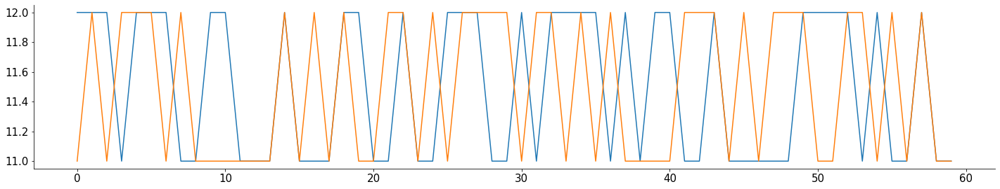

In [ ]:
plt.plot(dat1['stim_id'])
plt.plot(dat2['stim_id'])

In [ ]:
from nilearn import plotting  
from nimare import utils

plt.figure(figsize=(8,8))
locs = dat1['locs']
view = plotting.view_markers(utils.tal2mni(locs), marker_labels  = ['%d'%k for k in np.arange(locs.shape[0])], marker_color = 'purple', marker_size=5)
view

<Figure size 576x576 with 0 Axes>

In [ ]:
# quick way to get broadband power in time-varying windows
from scipy import signal

# pick subject 0 and experiment 0 (real movements)
dat1 = alldat[0][0]

# V is the voltage data
V = dat1['V'].astype('float32')

# high-pass filter above 50 Hz, above is noise
b, a = signal.butter(3, [50], btype = 'high', fs=1000) # why is it a thrid order filter?
V = signal.filtfilt(b,a,V,0)

# compute smooth envelope of this signal = approx power
V = np.abs(V)**2
b, a = signal.butter(3, [10], btype = 'low', fs=1000)
V = signal.filtfilt(b,a,V,0)

# normalize each channel so its mean power is 1
V = V/V.mean(0) 

In [ ]:
# Plotting filters
b, a = signal.butter(3, [10,30], btype = 'bandpass', fs=1000)
w, h = signal.freqs(b, a)
plt.semilogx(w, 20 * np.log10(abs(h)))
plt.title('Butterworth filter frequency response')
plt.xlabel('Frequency [radians / second]')
plt.ylabel('Amplitude [dB]')
plt.margins(0, 0.1)
plt.grid(which='both', axis='both')
plt.axvline(100, color='green') # cutoff frequency
plt.show()

NameError: ignored

In [ ]:
# Test
V = dat1['V'].astype('float32')

# band-pass filter test
b, a = signal.butter(3, [1,30], btype = 'bandpass', fs=1000) # why is it a thrid order filter?
V = signal.filtfilt(b,a,V,0)

# # compute smooth envelope of this signal = approx power
V = np.abs(V)**2
b, a = signal.butter(3, [20], btype = 'low', fs=1000)
V = signal.filtfilt(b,a,V,0)

# normalize each channel so its mean power is 1
V = V/V.mean(0)

In [ ]:
# average the broadband power across all tongue and hand trials

nt, nchan = V.shape
nstim = len(dat1['t_on'])

trange = np.arange(0, 2000) #time range?
ts = dat1['t_on'][:,np.newaxis] + trange #time series 
V_epochs = np.reshape(V[ts, :], (nstim, 2000, nchan))

V_tongue = (V_epochs[dat1['stim_id']==11]).mean(0) # averging across the experiment no.
V_hand   = (V_epochs[dat1['stim_id']==12]).mean(0)

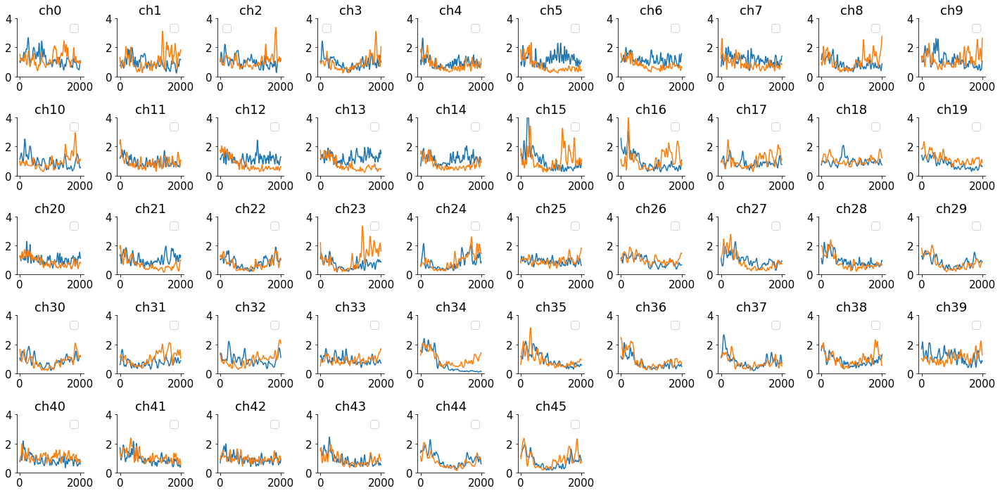

In [ ]:
# let's find the electrodes that distinguish tongue from hand movements
# note the behaviors happen some time after the visual cue 
from matplotlib import pyplot as plt

plt.figure(figsize=(20,10))
for j in range(46):
  ax = plt.subplot(5,10,j+1)
  plt.plot(trange, V_tongue[:,j]) #blue
  plt.plot(trange, V_hand[:,j]) #orange
  plt.title('ch%d'%j)
  plt.xticks([ 0, 2000])
  plt.ylim([0, 4])
  plt.legend()
  

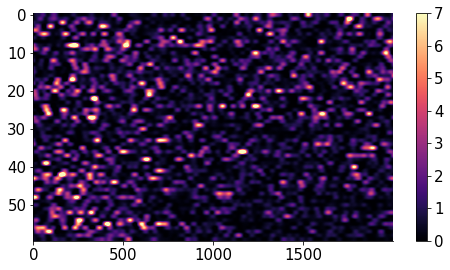

In [ ]:
# let's look at all the trials for electrode 20 that has a good response to hand movements
# we will sort trials by stimulus id
plt.subplot(1,3,1)
isort = np.argsort(dat1['stim_id'])
plt.imshow(V_epochs[isort,:,20].astype('float32'), aspect='auto', vmax=7, vmin = 0, cmap = 'magma')
plt.colorbar()

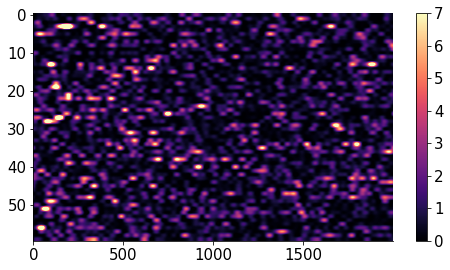

In [ ]:
# Electrode 42 seems to respond to tongue movements
isort = np.argsort(dat1['stim_id'])
plt.subplot(1,3,1)
plt.imshow(V_epochs[isort,:,42].astype('float32'), aspect='auto', vmax=7, vmin = 0, cmap = 'magma')
plt.colorbar()

subject:
0
subject:
1
subject:
2
subject:
3
subject:
4
subject:
5


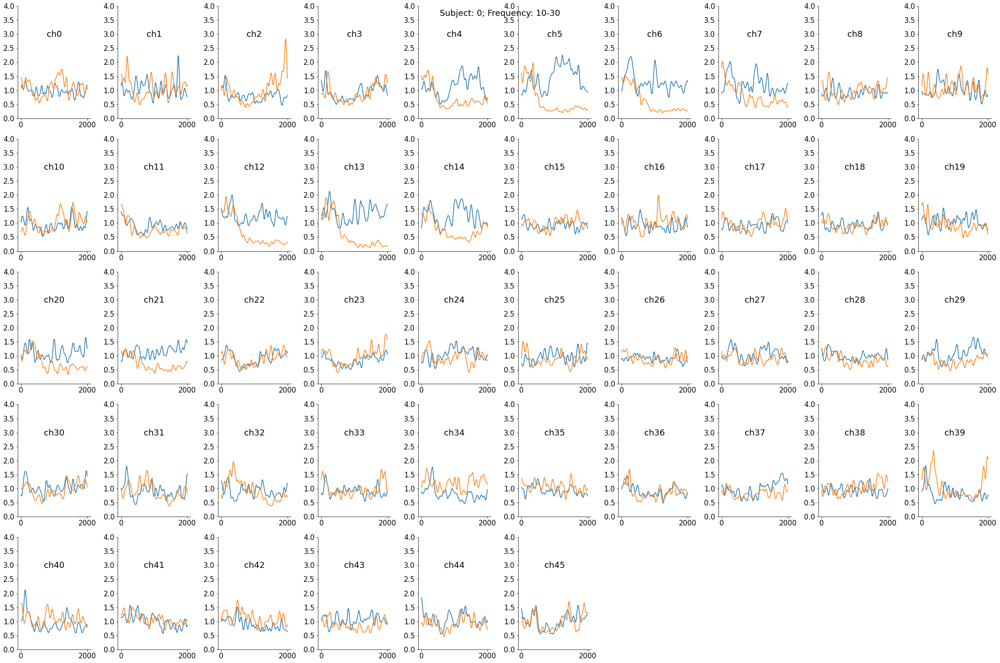

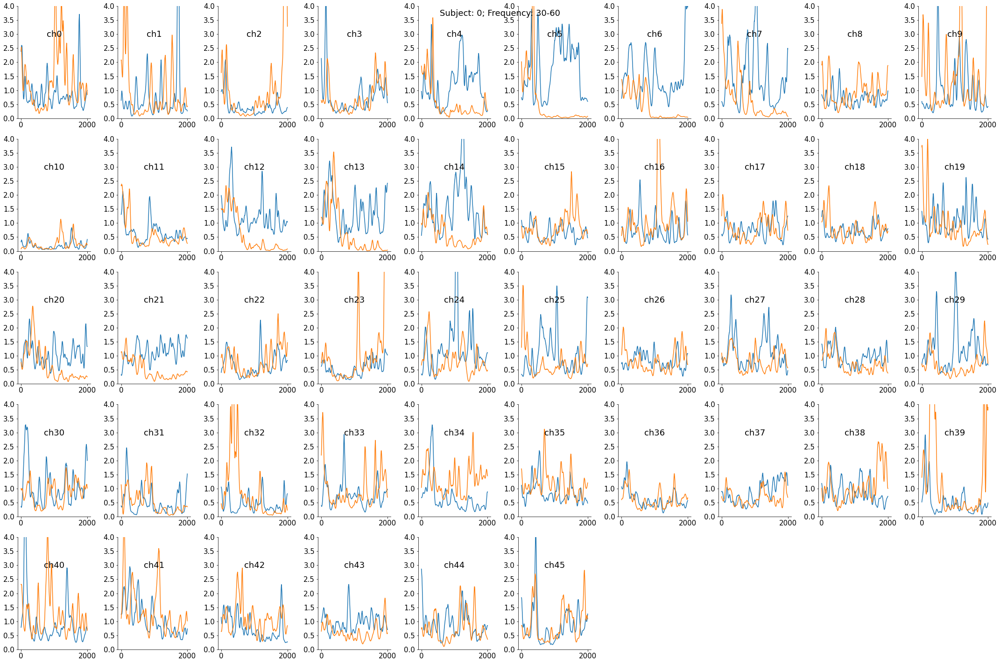

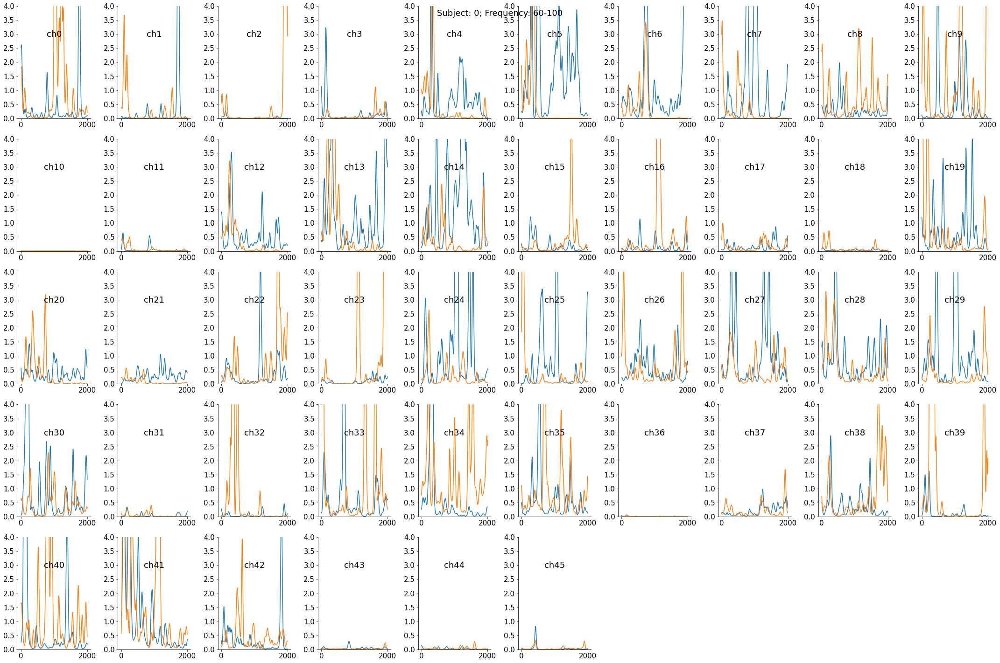

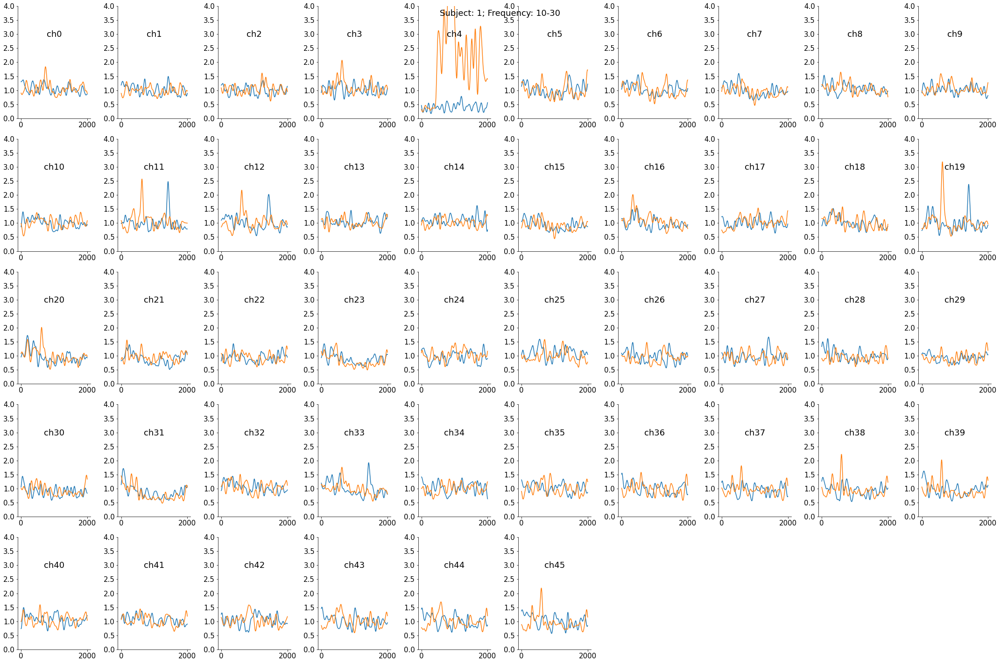

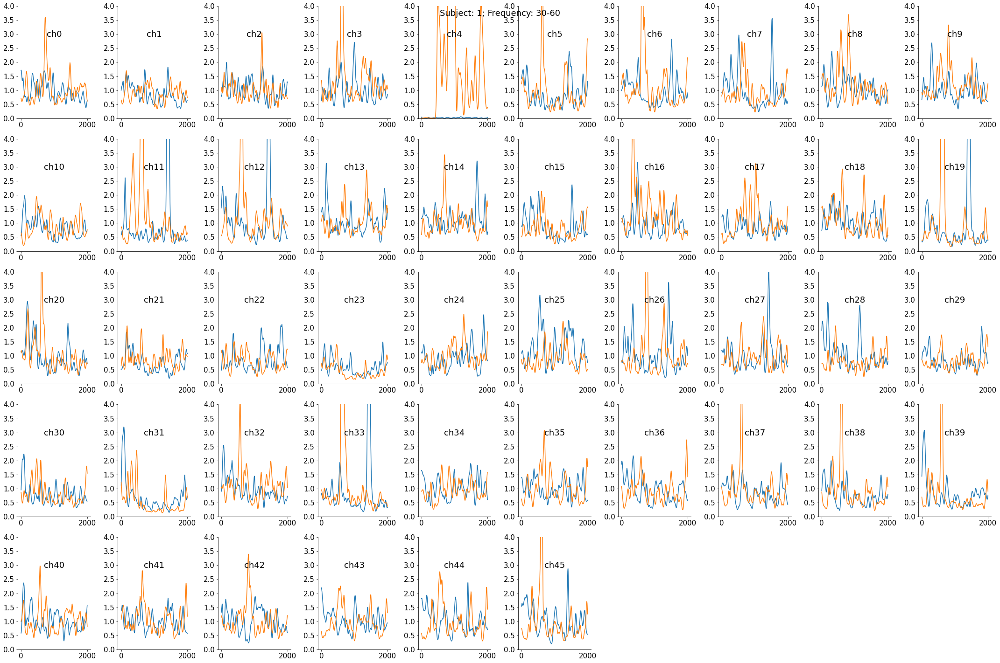

...

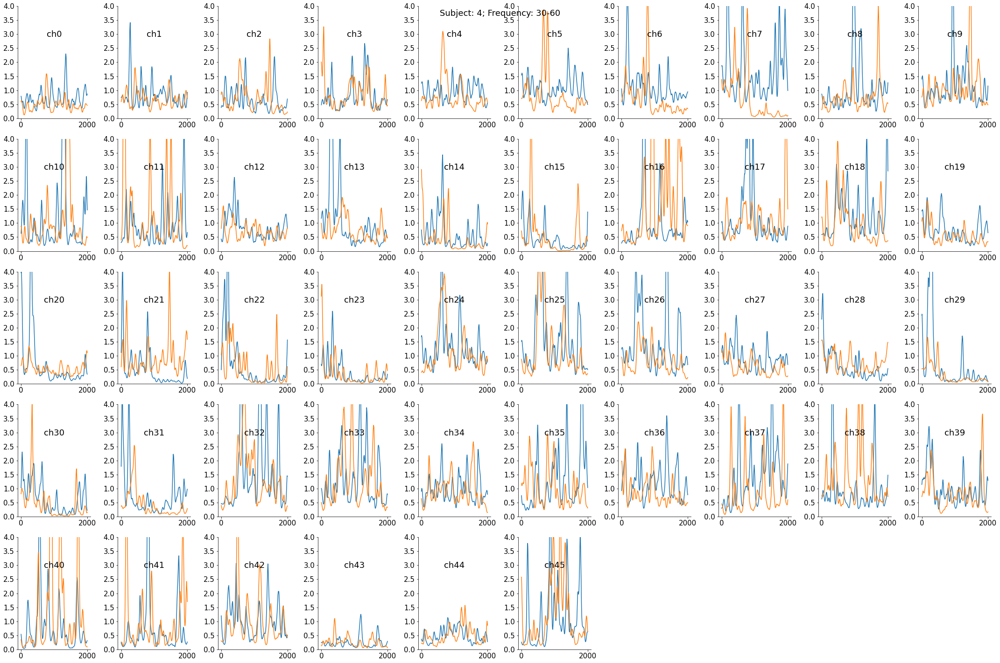

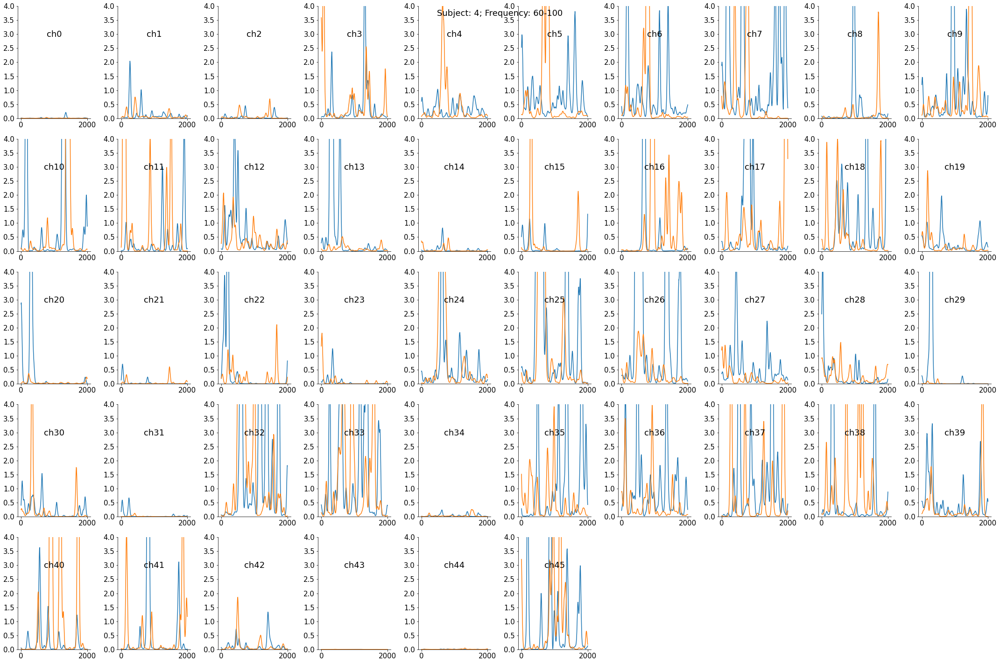

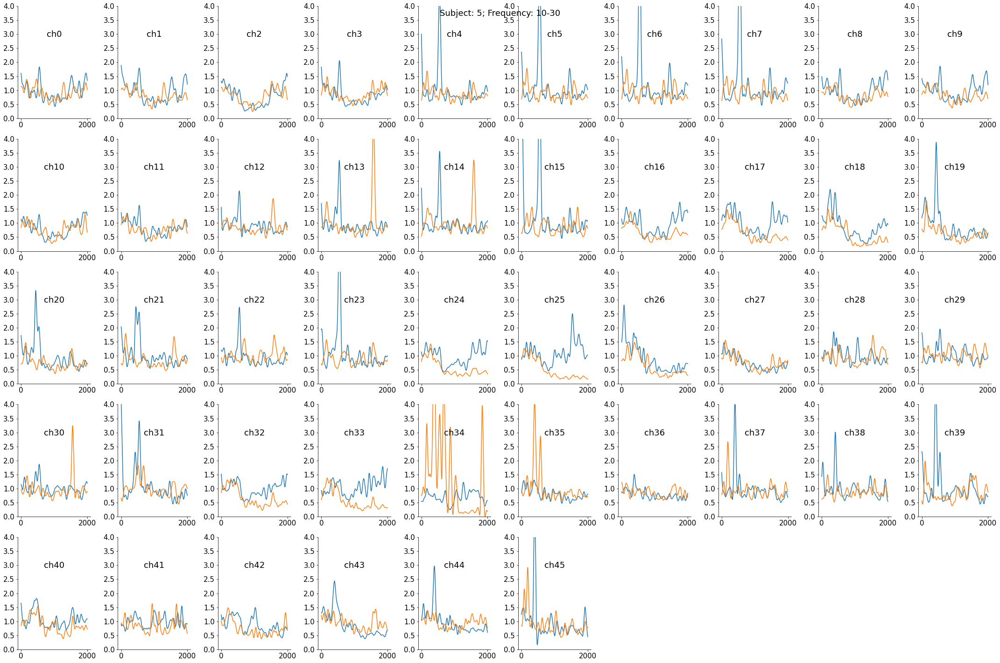

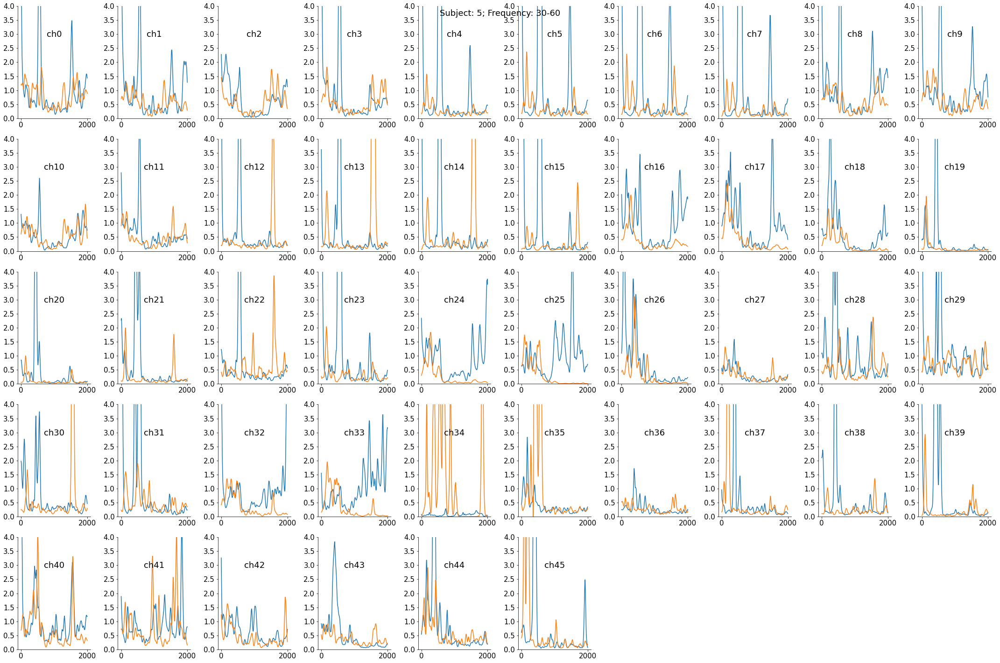

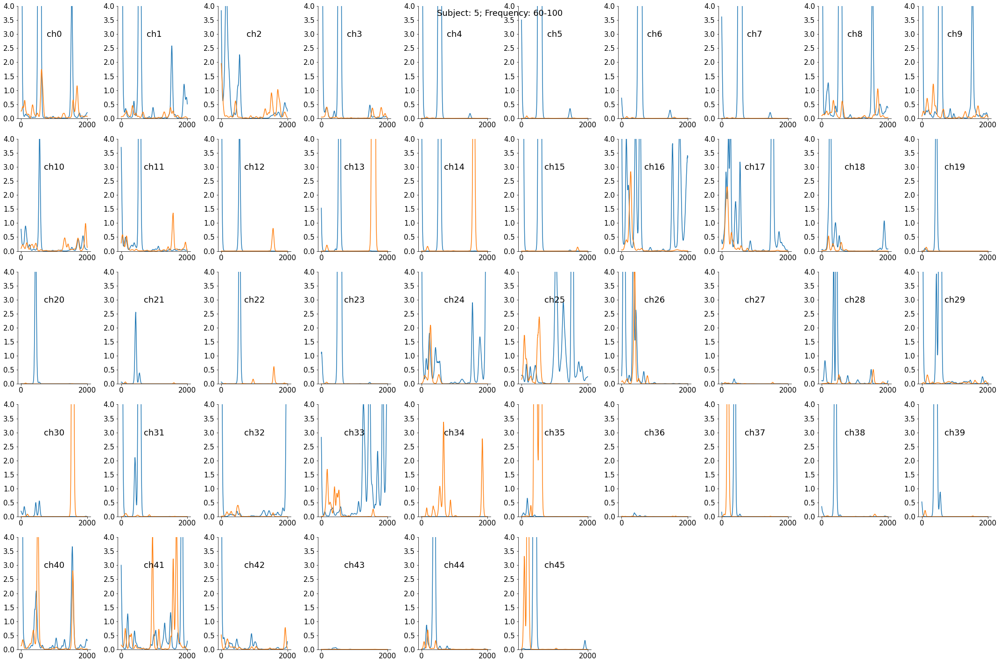

In [ ]:
# Go over all subjects and channels and frequency bands (0-30,30-60,60-90)
import numpy as np
# quick way to get broadband power in time-varying windows
from scipy import signal
alldat = np.load(fname, allow_pickle=True)['dat']
import warnings
from matplotlib import pyplot as plt

# loop thru all subjects
for i in range(6):
  print('subject:')
  print(i)
  # select just one of the recordings here. 11 is nice because it has some neurons in vis ctx. 
  dat1 = alldat[i][0]
  
  # V is the voltage data
  V = dat1['V'].astype('float32')

  # 10-30
  # band-pass filter test
  b, a = signal.butter(3, [10,30], btype = 'bandpass', fs=1000) # why is it a thrid order filter?
  V = signal.filtfilt(b,a,V,0)

  # compute smooth envelope of this signal = approx power
  V = np.abs(V)**2
  # b, a = signal.butter(3, [10], btype = 'low', fs=1000)
  # V = signal.filtfilt(b,a,V,0)

  # normalize each channel so its mean power is 1
  V = V/V.mean(0) 

  # average the broadband power across all tongue and hand trials
  nt, nchan = V.shape
  nstim = len(dat1['t_on'])

  trange = np.arange(0, 2000) #time range?
  ts = dat1['t_on'][:,np.newaxis] + trange #time series 
  V_epochs = np.reshape(V[ts, :], (nstim, 2000, nchan))

  V_tongue = (V_epochs[dat1['stim_id']==11]).mean(0) # averging across the experiment no.
  V_hand   = (V_epochs[dat1['stim_id']==12]).mean(0)


  # let's find the electrodes that distinguish tongue from hand movements
  # note the behaviors happen some time after the visual cue 

  warnings.filterwarnings('ignore')
  plt.figure(figsize=(30,20))
  title_str = "Subject: "+str(i)+"; "+"Frequency: 10-30"+"\n"
  plt.suptitle(title_str)
  for j in range(46):
    ax = plt.subplot(5,10,j+1)
    plt.plot(trange, V_tongue[:,j],label= 'tongue') #blue
    plt.plot(trange, V_hand[:,j]) #orange
    # ax.set_title('ch%d'%j,y=1)
    plt.title('ch%d'%j,y=0.7)
    plt.xticks([ 0, 2000])
    plt.ylim([0, 4])
  
  # 30-60
  # band-pass filter test
  b, a = signal.butter(3, [30,60], btype = 'bandpass', fs=1000) # why is it a thrid order filter?
  V = signal.filtfilt(b,a,V,0)

  # compute smooth envelope of this signal = approx power
  V = np.abs(V)**2
  # b, a = signal.butter(3, [30], btype = 'low', fs=1000)
  # V = signal.filtfilt(b,a,V,0)

  # normalize each channel so its mean power is 1
  V = V/V.mean(0) 

  # average the broadband power across all tongue and hand trials
  nt, nchan = V.shape
  nstim = len(dat1['t_on'])

  trange = np.arange(0, 2000) #time range?
  ts = dat1['t_on'][:,np.newaxis] + trange #time series 
  V_epochs = np.reshape(V[ts, :], (nstim, 2000, nchan))

  V_tongue = (V_epochs[dat1['stim_id']==11]).mean(0) # averging across the experiment no.
  V_hand   = (V_epochs[dat1['stim_id']==12]).mean(0)

  # let's find the electrodes that distinguish tongue from hand movements
  # note the behaviors happen some time after the visual cue 

  warnings.filterwarnings('ignore')
  plt.figure(figsize=(30,20))
  title_str = "Subject: "+str(i)+"; "+"Frequency: 30-60"
  plt.suptitle(title_str)
  for j in range(46):
    ax = plt.subplot(5,10,j+1)
    plt.plot(trange, V_tongue[:,j],label= 'tongue') #blue
    plt.plot(trange, V_hand[:,j]) #orange
    # ax.set_title('ch%d'%j,y=1)
    plt.title('ch%d'%j,y=0.7)
    plt.xticks([ 0, 2000])
    plt.ylim([0, 4])

  # 60-100
  # band-pass filter test
  b, a = signal.butter(3, [60,100], btype = 'bandpass', fs=1000) # why is it a thrid order filter?
  V = signal.filtfilt(b,a,V,0)

  # compute smooth envelope of this signal = approx power
  V = np.abs(V)**2
  # b, a = signal.butter(3, [60], btype = 'low', fs=1000)
  # V = signal.filtfilt(b,a,V,0)

  # normalize each channel so its mean power is 1
  V = V/V.mean(0) 

  # average the broadband power across all tongue and hand trials
  nt, nchan = V.shape
  nstim = len(dat1['t_on'])

  trange = np.arange(0, 2000) #time range?
  ts = dat1['t_on'][:,np.newaxis] + trange #time series 
  V_epochs = np.reshape(V[ts, :], (nstim, 2000, nchan))

  V_tongue = (V_epochs[dat1['stim_id']==11]).mean(0) # averging across the experiment no.
  V_hand   = (V_epochs[dat1['stim_id']==12]).mean(0)

  # let's find the electrodes that distinguish tongue from hand movements
  # note the behaviors happen some time after the visual cue 

  warnings.filterwarnings('ignore')
  plt.figure(figsize=(30,20))
  title_str = "Subject: "+str(i)+"; "+"Frequency: 60-100"
  plt.suptitle(title_str)
  for j in range(46):
    ax = plt.subplot(5,10,j+1)
    plt.plot(trange, V_tongue[:,j],label= 'tongue') #blue
    plt.plot(trange, V_hand[:,j]) #orange
    # ax.set_title('ch%d'%j,y=1)
    plt.title('ch%d'%j,y=0.7)
    plt.xticks([ 0, 2000])
    plt.ylim([0, 4])


In [ ]:
# Go over all subjects and channels and frequency bands (0-30,30-60,60-90)
import numpy as np
# quick way to get broadband power in time-varying windows
from scipy import signal
alldat = np.load(fname, allow_pickle=True)['dat']
import warnings
from matplotlib import pyplot as plt

# loop thru all subjects
for i in range(6):
  print('subject:')
  print(i)
  # select just one of the recordings here. 11 is nice because it has some neurons in vis ctx. 
  dat1 = alldat[i][0]
  
  # V is the voltage data
  V = dat1['V'].astype('float32')

  # 10-30
  # band-pass filter test
  b, a = signal.butter(3, [10,30], btype = 'bandpass', fs=1000) # why is it a thrid order filter?
  V = signal.filtfilt(b,a,V,0)

  # compute smooth envelope of this signal = approx power
  V = np.abs(V)**2
  # b, a = signal.butter(3, [10], btype = 'low', fs=1000)
  # V = signal.filtfilt(b,a,V,0)

  # normalize each channel so its mean power is 1
  V = V/V.mean(0) 

  # average the broadband power across all tongue and hand trials
  nt, nchan = V.shape
  nstim = len(dat1['t_on'])

  trange = np.arange(0, 2000) #time range?
  ts = dat1['t_on'][:,np.newaxis] + trange #time series 
  V_epochs = np.reshape(V[ts, :], (nstim, 2000, nchan))

  V_tongue = (V_epochs[dat1['stim_id']==11]).mean(0) # averging across the experiment no.
  V_hand   = (V_epochs[dat1['stim_id']==12]).mean(0)


  # let's find the electrodes that distinguish tongue from hand movements
  # note the behaviors happen some time after the visual cue 

  warnings.filterwarnings('ignore')
  plt.figure(figsize=(30,20))
  title_str = "Subject: "+str(i)+"; "+"Frequency: 10-30"+"\n"
  plt.suptitle(title_str)
  for j in range(46):
    ax = plt.subplot(5,10,j+1)
    plt.plot(trange, V_tongue[:,j],label= 'tongue') #blue
    plt.plot(trange, V_hand[:,j]) #orange
    # ax.set_title('ch%d'%j,y=1)
    plt.title('ch%d'%j,y=0.7)
    plt.xticks([ 0, 2000])
    plt.ylim([0, 4])
  
  # 30-60
  # band-pass filter test
  b, a = signal.butter(3, [30,60], btype = 'bandpass', fs=1000) # why is it a thrid order filter?
  V = signal.filtfilt(b,a,V,0)

  # compute smooth envelope of this signal = approx power
  V = np.abs(V)**2
  # b, a = signal.butter(3, [30], btype = 'low', fs=1000)
  # V = signal.filtfilt(b,a,V,0)

  # normalize each channel so its mean power is 1
  V = V/V.mean(0) 

  # average the broadband power across all tongue and hand trials
  nt, nchan = V.shape
  nstim = len(dat1['t_on'])

  trange = np.arange(0, 2000) #time range?
  ts = dat1['t_on'][:,np.newaxis] + trange #time series 
  V_epochs = np.reshape(V[ts, :], (nstim, 2000, nchan))

  V_tongue = (V_epochs[dat1['stim_id']==11]).mean(0) # averging across the experiment no.
  V_hand   = (V_epochs[dat1['stim_id']==12]).mean(0)

  # let's find the electrodes that distinguish tongue from hand movements
  # note the behaviors happen some time after the visual cue 

  warnings.filterwarnings('ignore')
  plt.figure(figsize=(30,20))
  title_str = "Subject: "+str(i)+"; "+"Frequency: 30-60"
  plt.suptitle(title_str)
  for j in range(46):
    ax = plt.subplot(5,10,j+1)
    plt.plot(trange, V_tongue[:,j],label= 'tongue') #blue
    plt.plot(trange, V_hand[:,j]) #orange
    # ax.set_title('ch%d'%j,y=1)
    plt.title('ch%d'%j,y=0.7)
    plt.xticks([ 0, 2000])
    plt.ylim([0, 4])

  # 60-100
  # band-pass filter test
  b, a = signal.butter(3, [60,100], btype = 'bandpass', fs=1000) # why is it a thrid order filter?
  V = signal.filtfilt(b,a,V,0)

  # compute smooth envelope of this signal = approx power
  V = np.abs(V)**2
  # b, a = signal.butter(3, [60], btype = 'low', fs=1000)
  # V = signal.filtfilt(b,a,V,0)

  # normalize each channel so its mean power is 1
  V = V/V.mean(0) 

  # average the broadband power across all tongue and hand trials
  nt, nchan = V.shape
  nstim = len(dat1['t_on'])

  trange = np.arange(0, 2000) #time range?
  ts = dat1['t_on'][:,np.newaxis] + trange #time series 
  V_epochs = np.reshape(V[ts, :], (nstim, 2000, nchan))

  V_tongue = (V_epochs[dat1['stim_id']==11]).mean(0) # averging across the experiment no.
  V_hand   = (V_epochs[dat1['stim_id']==12]).mean(0)

  # let's find the electrodes that distinguish tongue from hand movements
  # note the behaviors happen some time after the visual cue 

  warnings.filterwarnings('ignore')
  plt.figure(figsize=(30,20))
  title_str = "Subject: "+str(i)+"; "+"Frequency: 60-100"
  plt.suptitle(title_str)
  for j in range(46):
    ax = plt.subplot(5,10,j+1)
    plt.plot(trange, V_tongue[:,j],label= 'tongue') #blue
    plt.plot(trange, V_hand[:,j]) #orange
    # ax.set_title('ch%d'%j,y=1)
    plt.title('ch%d'%j,y=0.7)
    plt.xticks([ 0, 2000])
    plt.ylim([0, 4])


NameError: ignored